In [115]:
#importing the necessary libraries for the project. 
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
import statsmodels
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from statsmodels.tools.eval_measures import rmse
from statsmodels.api import qqplot
from scipy import stats
from sklearn.preprocessing import OneHotEncoder
from folium.plugins import FastMarkerCluster
import folium
from sklearn.metrics import r2_score
import branca.colormap as cm
import matplotlib.ticker as ticker

In [116]:
#loading in the data and making a pandas dataframe.
df = pd.read_csv('data/kc_house_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [117]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [118]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


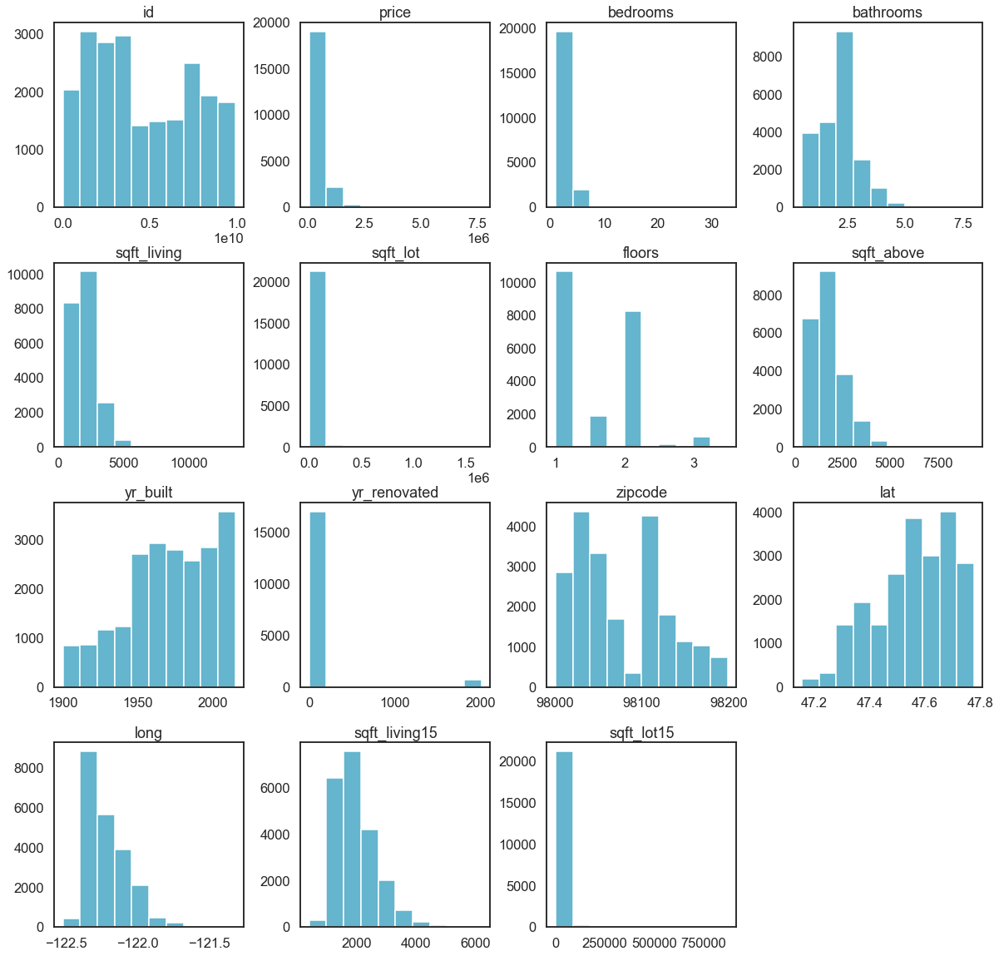

In [119]:
df.hist(grid=False, color='c', figsize=(20,20)); 

In [120]:
#exploring and filtering

df.drop_duplicates(subset='id',keep='first',inplace=True)
df['waterfront'].fillna(0, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21420 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21420 non-null  int64  
 1   date           21420 non-null  object 
 2   price          21420 non-null  float64
 3   bedrooms       21420 non-null  int64  
 4   bathrooms      21420 non-null  float64
 5   sqft_living    21420 non-null  int64  
 6   sqft_lot       21420 non-null  int64  
 7   floors         21420 non-null  float64
 8   waterfront     21420 non-null  object 
 9   view           21357 non-null  object 
 10  condition      21420 non-null  object 
 11  grade          21420 non-null  object 
 12  sqft_above     21420 non-null  int64  
 13  sqft_basement  21420 non-null  object 
 14  yr_built       21420 non-null  int64  
 15  yr_renovated   17616 non-null  float64
 16  zipcode        21420 non-null  int64  
 17  lat            21420 non-null  float64
 18  long  

In [121]:
for column in list(df.columns):
    print(column, sum(df[column].isnull()))

id 0
date 0
price 0
bedrooms 0
bathrooms 0
sqft_living 0
sqft_lot 0
floors 0
waterfront 0
view 63
condition 0
grade 0
sqft_above 0
sqft_basement 0
yr_built 0
yr_renovated 3804
zipcode 0
lat 0
long 0
sqft_living15 0
sqft_lot15 0


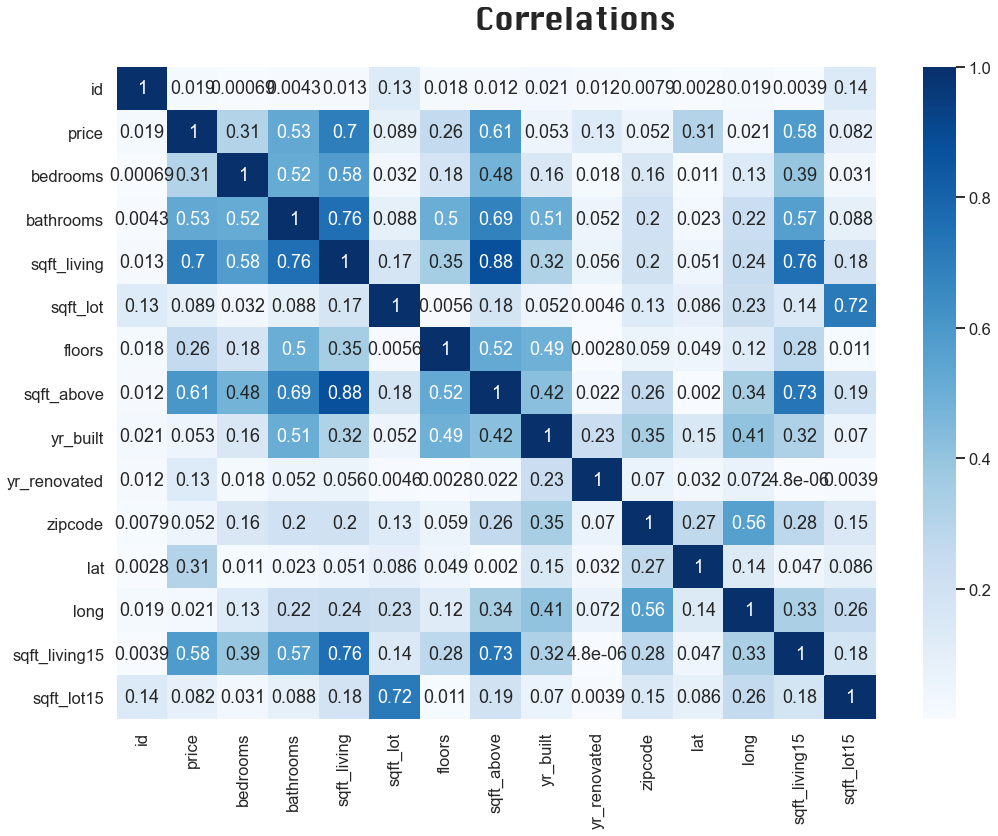

In [122]:
corr = df.corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Correlations', fontsize=30, y=.95, fontname='Silom')
heatmap = sns.heatmap(corr, cmap='Blues', annot=True)

In [123]:
features = []
correlations = []
for idx, correlation in corr['price'].T.iteritems():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.iteritems():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(MC_df)

Multicollinear Features


,Correlations,Features
0,0.876533,"[sqft_living, sqft_above]"
1,0.876533,"[sqft_above, sqft_living]"


Correlations with Price


,Correlations,Features
0,0.876533,"[sqft_living, sqft_above]"
1,0.876533,"[sqft_above, sqft_living]"


/Users/darla/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'House View and Price')

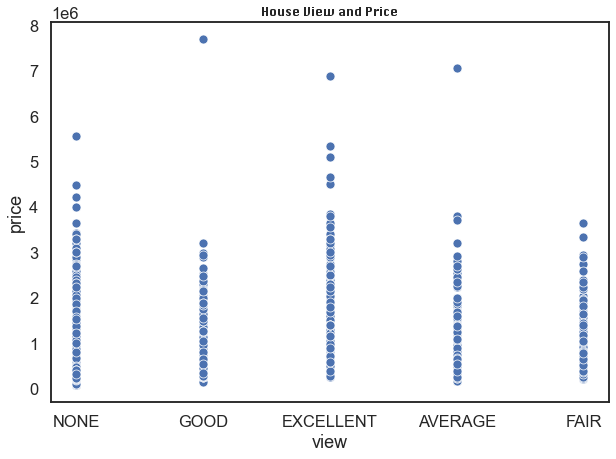

In [124]:
plt.figure(figsize=(10,7))
sns.scatterplot(df['view'], df['price'])
plt.title('House View and Price', fontsize=12, fontname='silom')

# I DONT FUCKING GET WHY IT WONT WORK ARGHGHGHGHGH

In [168]:
grade_price = df[['grade', 'price']]
gp_bins = [1,2,3,4,5,6,7,8,9,10,11,12]
gp_bins_labels = ['a','b','c','d','e','f','g','h','i','j','k']
grade_price['gp_bins'] = pd.cut(x=grade_price['grade'], bins=gp_bins, labels=gp_bins_labels)

TypeError: '<' not supported between instances of 'int' and 'str'

In [169]:
plt.figure(figsize=(20,10))
gp_barplot = sns.barplot(x='gp_bins', y='price', data=grade_price, palette='crest')
sns.set_theme(context= 'talk',style='white')
gp_barplot.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
gp_barplot.set_ylabel('Price (Thousands)', fontsize=20)
gp_barplot.set_xlabel('Grade (In Categories)', fontsize=20)
plt.title('bathrooms and price', fontsize=30, fontname='silom')
plt.savefig('Images/grade_price_barplot.png', bbox_inches='tight', pad_inches=1)

ValueError: Could not interpret input 'gp_bins'

<Figure size 1440x720 with 0 Axes>

In [139]:
bath_price = df[['bathrooms', 'price']]
bins = [1,2,3,4,5]
bin_labels = ['0-1 bath', '2-3 baths', '4-5 baths', '6+ baths']
bath_price['bins'] = pd.cut(x=bath_price['bathrooms'], bins=bins, labels=bin_labels)

<ipython-input-139-4373321109c3>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bath_price['bins'] = pd.cut(x=bath_price['bathrooms'], bins=bins, labels=bin_labels)


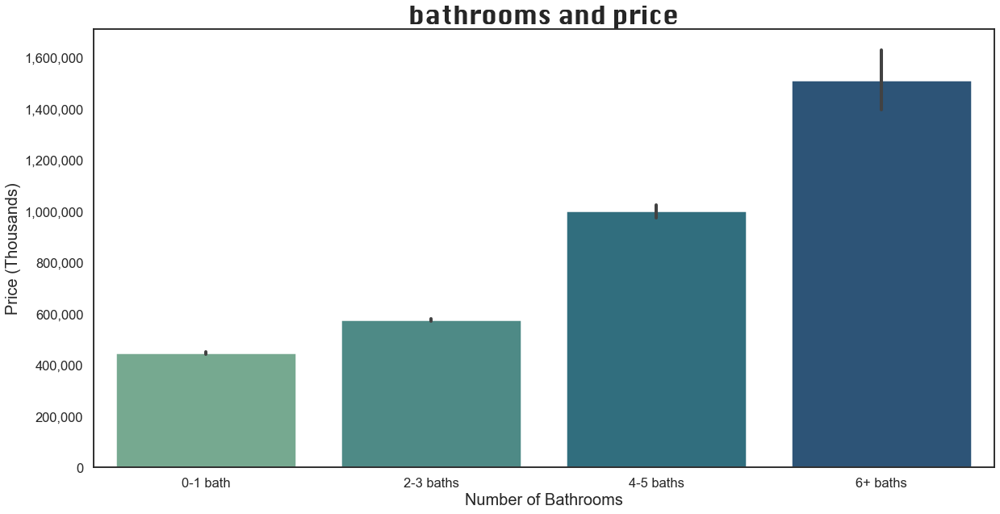

In [141]:
plt.figure(figsize=(20,10))
bp_barplot = sns.barplot(x='bins', y='price', data=bath_price, palette='crest')
sns.set_theme(context= 'talk',style='white')
bp_barplot.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
bp_barplot.set_ylabel('Price (Thousands)', fontsize=20)
bp_barplot.set_xlabel('Number of Bathrooms', fontsize=20)
plt.title('bathrooms and price', fontsize=30, fontname='silom')
plt.savefig('Images/bath_price_barplot.png', bbox_inches='tight', pad_inches=1)

In [171]:
def get_center_latlong(df):
    centerlat = (df['lat'].max() + df['lat'].min()) / 2
    centerlong =  (df['long'].max() + df['long'].min()) / 2
    return centerlat, centerlong




In [172]:
center = get_center_latlong(df)

In [182]:
colormap = cm.LinearColormap(colors=['darkblue', 'lightblue', 'yellow', 'lightyellow', 'snow'], vmin=df['sqft_living'].min(), vmax=df['sqft_living'].max())


sqft_map = folium.Map(location=center, zoom_start=10)
for i in range(len(df)):
    folium.Circle(
    location=[df.iloc[i]['lat'], df.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(df.iloc[i]['sqft_living']),
        fill_opacity=0.2).add_to(sqft_map)
    
sqft_map.add_child(colormap)

In [ ]:
df = df[(df["bathrooms"] == 7.5)]
df

In [ ]:
df.sqft_living.describe()

In [ ]:
features = X_train.columns

for x in features:
    plt.scatter(X_train[x], y_train)
    plt.title(f'Plot of Price against {x}')
    plt.xlabel(x)
    plt.ylabel('Price')
    plt.show()
    
# also plot sales against itself
plt.scatter(y_train.index, y_train)
plt.hlines(y_train.mean(), 0, 200)
plt.xlabel('Index Value')
plt.ylabel('Price')
plt.title('Variance of Price')
plt.show()

In [ ]:
train_df = pd.concat([X_train, y_train], axis =1)

In [ ]:
sns.pairplot(train_df)
plt.show()

In [ ]:
y = df.price
X = df[['bedrooms', 'bathrooms', 'sqft_living','sqft_lot','yr_built','grade' ]]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42)

In [ ]:
ohe = OneHotEncoder()
ohe.fit_transform(X_train)

In [ ]:
train_df.corr()

In [ ]:
#Dummy Regressor for the baseline. DUMMY IS ONLY APPLIED ON TRAINING SET
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
dummy_regr.predict(X_train)

In [ ]:
y_train.shape
y_train

In [ ]:
# NOW CREATE FIRST SIMPLE MODEL THAT DOES BETTER THAN DUMMY REGRESSOR MEAN.
#EXAMPLES; RECURSIVE FEATURE ELIMINATION. LOOK AT HIGH CORRELATIONS VARIABLES TO Y.

#MODEL 1

In [ ]:
y = df.price
X = df[['bedrooms', 'bathrooms', 'sqft_living','sqft_lot','yr_built','grade', 'floors' ]]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42) 

In [ ]:
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
dummy_regr.predict(X_train)